In [128]:
import numpy as np 
import pandas as pd 

In [129]:
df=pd.read_csv('fitness_dataset_5000.csv')

In [130]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  5000 non-null   int64  
 1   gender               5000 non-null   object 
 2   height_cm            5000 non-null   float64
 3   weight_kg            5000 non-null   float64
 4   waist_cm             5000 non-null   float64
 5   neck_cm              5000 non-null   float64
 6   hip_cm               5000 non-null   float64
 7   sleep_hours          5000 non-null   float64
 8   workouts_per_week    5000 non-null   int64  
 9   daily_calories       5000 non-null   int64  
 10  activity_level       5000 non-null   object 
 11  fitness_goal         5000 non-null   object 
 12  body_fat_percentage  5000 non-null   float64
dtypes: float64(7), int64(3), object(3)
memory usage: 507.9+ KB


In [131]:
df.columns

Index(['age', 'gender', 'height_cm', 'weight_kg', 'waist_cm', 'neck_cm',
       'hip_cm', 'sleep_hours', 'workouts_per_week', 'daily_calories',
       'activity_level', 'fitness_goal', 'body_fat_percentage'],
      dtype='object')

In [132]:
df.sample(5)

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
1578,28,female,163.1,45.0,82.7,29.4,91.1,7.0,7,2151,active,muscle_gain,10.54
4142,22,male,173.8,94.8,93.8,34.5,105.7,6.1,1,2558,sedentary,muscle_gain,26.52
1912,24,female,153.8,51.0,96.4,30.1,97.3,6.8,2,1736,moderate,maintain,15.19
1376,26,female,150.4,41.4,83.3,28.9,91.1,8.4,4,1813,light,maintain,11.74
3948,17,female,153.8,64.4,87.2,31.4,103.8,7.8,3,1765,light,maintain,20.38


In [133]:
import seaborn as sns 

<Axes: xlabel='age'>

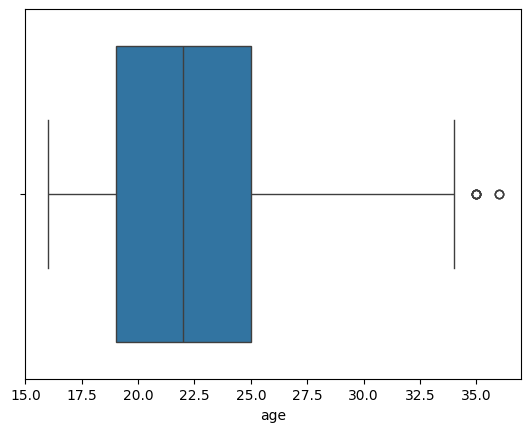

In [134]:
sns.boxplot(x=df['age'])

In [135]:
# we have to remove the outliers in age feature
df['age'].skew()

np.float64(0.30669823869158075)

In [136]:
# we observe data is little positively skewd so we will apply IQR rule removal 
df['age'].describe()

count    5000.000000
mean       22.332400
std         4.188964
min        16.000000
25%        19.000000
50%        22.000000
75%        25.000000
max        36.000000
Name: age, dtype: float64

In [137]:
Q1=19
Q2=22
Q3=25

In [138]:
IQR=Q3-Q1

In [139]:
min=Q1-1.5*IQR
max=Q3+1.5*IQR

In [140]:
df[df['age']>max]

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
398,35,male,179.9,56.5,88.9,30.5,83.1,7.1,3,2306,moderate,maintain,12.80
1241,35,male,174.7,85.0,88.0,32.3,99.2,7.3,1,1663,sedentary,fat_loss,25.27
1694,36,female,145.0,41.2,91.3,31.5,94.7,7.8,1,1200,light,fat_loss,15.59
1921,35,male,165.2,54.3,97.5,32.3,97.2,6.8,5,2532,moderate,muscle_gain,15.73
2661,36,male,174.0,83.0,81.0,32.7,91.2,7.4,6,2750,active,fat_loss,24.98
2739,35,male,167.8,75.2,98.5,32.9,93.1,7.9,1,2366,light,muscle_gain,23.90
3315,35,male,173.7,58.2,94.2,32.3,87.7,6.9,3,1900,light,fat_loss,15.00
4261,35,female,159.9,65.2,87.1,32.2,107.0,8.3,2,1750,sedentary,muscle_gain,22.45
4372,36,male,183.6,63.9,79.1,32.3,94.6,6.7,3,2642,moderate,maintain,14.83
4698,35,male,179.9,86.7,91.3,30.7,93.2,5.8,1,2512,sedentary,muscle_gain,24.00


In [141]:
df[df['age']<min]

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage


In [142]:
# capping 
new_df=df.copy()
new_df['age']=np.where(
    new_df['age']>max,
    max,
    np.where(
        new_df['age']<min,
        min,
        new_df['age']
    )
)

<Axes: xlabel='age'>

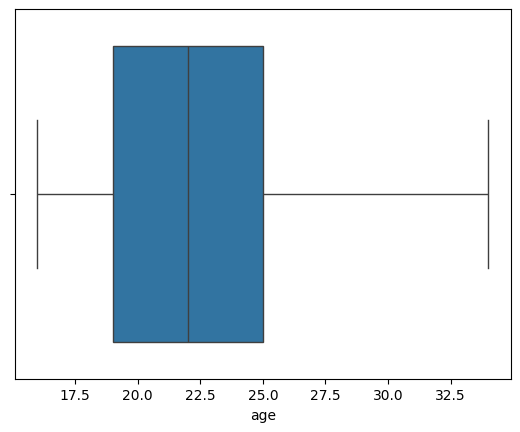

In [143]:
sns.boxplot(x=new_df['age'])

In [144]:
df['age'].shape

(5000,)

In [145]:
df['age']=new_df['age']

In [146]:
df['age'].shape

(5000,)

In [147]:
df.columns

Index(['age', 'gender', 'height_cm', 'weight_kg', 'waist_cm', 'neck_cm',
       'hip_cm', 'sleep_hours', 'workouts_per_week', 'daily_calories',
       'activity_level', 'fitness_goal', 'body_fat_percentage'],
      dtype='object')

In [148]:
df.shape

(5000, 13)

<Axes: xlabel='height_cm'>

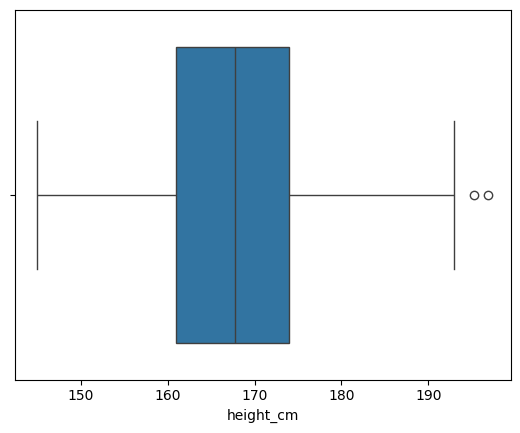

In [149]:
sns.boxplot(x=df['height_cm'])

In [150]:
df['height_cm'].skew()

np.float64(-0.05812814844936349)

In [151]:
# not skewed means normally distributed 
df['height_cm'].describe()


count    5000.00000
mean      167.51136
std         9.02831
min       145.00000
25%       160.90000
50%       167.80000
75%       174.00000
max       196.90000
Name: height_cm, dtype: float64

In [152]:
mean=167.511
std=9.02831

In [153]:
print("highest allowed",mean+3*std)
print("lowest_allowed",mean-3*std)

highest allowed 194.59593
lowest_allowed 140.42606999999998


In [154]:
df[df['height_cm']>194.595]

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
383,24.0,male,196.9,101.3,84.7,35.4,99.7,5.8,0,2422,sedentary,maintain,20.67
4187,32.0,male,195.3,95.8,82.8,35.3,84.9,7.8,5,2532,moderate,fat_loss,21.30


In [155]:
df[df['height_cm']<140.42]

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage


In [156]:
# trimming for remove the outlier
new_df=df[df['height_cm']<194.595]

In [157]:
new_df

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
0,28.0,female,156.1,47.8,95.0,30.2,98.4,6.0,0,1887,sedentary,muscle_gain,13.78
1,30.0,male,179.5,76.2,88.6,33.7,93.0,6.4,2,2730,moderate,muscle_gain,19.08
2,23.0,female,158.8,59.7,96.5,30.2,92.2,7.9,3,1200,moderate,fat_loss,17.50
3,16.0,female,156.4,59.9,105.2,29.0,101.9,7.5,1,1275,sedentary,fat_loss,16.87
4,30.0,male,172.4,76.9,87.7,30.2,101.3,7.8,1,1818,sedentary,fat_loss,21.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,26.0,male,175.4,86.3,89.5,34.4,93.3,6.7,3,2463,light,maintain,23.44
4996,22.0,male,170.6,72.7,97.1,31.2,92.5,7.0,3,2416,light,muscle_gain,18.83
4997,34.0,male,181.2,95.8,120.0,33.4,97.1,7.1,0,1720,sedentary,fat_loss,26.63
4998,18.0,male,166.0,81.1,98.1,30.2,97.9,7.0,0,2205,light,fat_loss,23.26


In [158]:
new_df.shape

(4998, 13)

<Axes: xlabel='height_cm'>

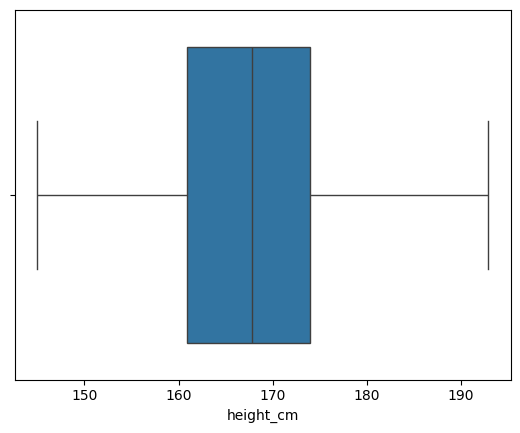

In [159]:
sns.boxplot(x=new_df['height_cm'])

<Axes: xlabel='age'>

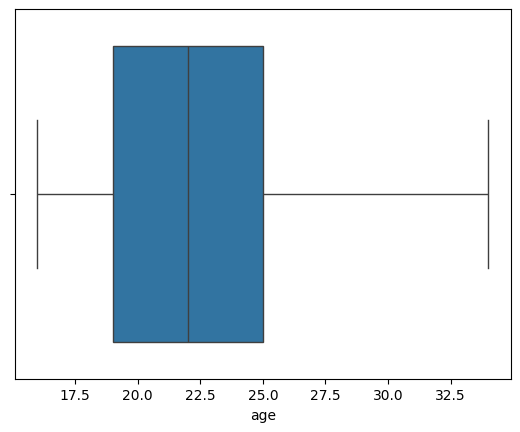

In [160]:
sns.boxplot(x=new_df['age'])

<Axes: xlabel='weight_kg'>

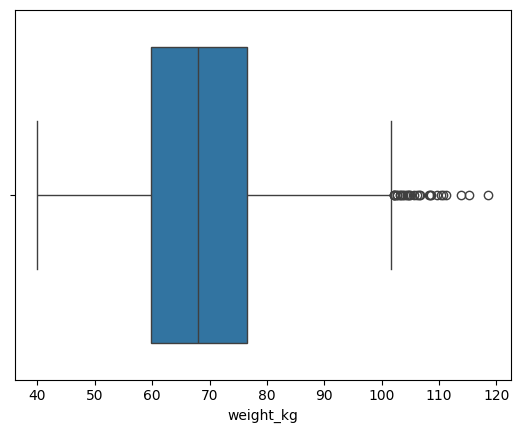

In [161]:
sns.boxplot(x=df['weight_kg'])

In [162]:
new_df['weight_kg'].skew()

np.float64(0.2977951441165092)

In [163]:
# we again apply IQR proximity rule 
df['weight_kg'].describe()

count    5000.000000
mean       68.595420
std        12.396311
min        40.000000
25%        59.800000
50%        68.000000
75%        76.600000
max       118.600000
Name: weight_kg, dtype: float64

In [164]:
Q1=59.80000
Q3=76.60000
Q2=68.00000
IQR=Q3-Q1

In [165]:
min=Q1-1.5*IQR

In [166]:
max=Q3+1.5*IQR

In [167]:
df[df['weight_kg']<min]

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage


In [168]:
df[df['weight_kg']>max]

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
25,31.0,male,184.5,110.4,91.1,37.2,93.7,5.7,5,2588,moderate,fat_loss,29.85
374,16.0,male,190.8,110.7,111.5,36.8,98.6,7.3,5,3531,moderate,muscle_gain,23.97
395,27.0,male,185.4,103.2,85.3,34.9,86.8,6.4,4,2528,light,fat_loss,26.04
725,19.0,male,183.4,106.5,88.2,38.7,105.5,6.5,4,3547,active,maintain,26.17
746,28.0,male,186.7,113.9,91.9,37.6,99.7,6.4,3,2886,sedentary,muscle_gain,29.45
1184,28.0,male,176.4,102.4,80.1,33.9,102.8,6.5,1,2181,sedentary,fat_loss,29.73
1204,30.0,male,177.6,102.6,90.5,34.2,97.9,6.7,1,2096,sedentary,fat_loss,29.73
1490,16.0,male,182.0,103.2,84.5,35.9,100.8,7.8,1,2543,light,fat_loss,24.87
1528,25.0,male,184.5,102.2,85.1,34.2,95.6,8.2,4,3062,light,muscle_gain,25.58
1581,16.0,male,184.8,108.4,101.5,32.6,93.5,7.6,0,3585,moderate,muscle_gain,25.57


In [169]:
new_df=new_df.copy()
new_df['weight_kg']=np.where(
 new_df['weight_kg']>max,
    max,
    np.where(
        new_df['weight_kg']<min,
        min,
        new_df['weight_kg']
    )
)

<Axes: xlabel='weight_kg'>

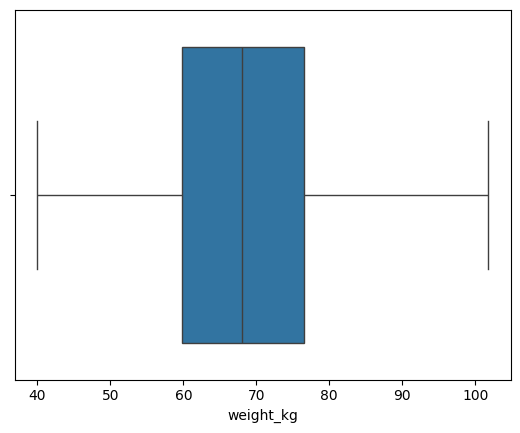

In [170]:
sns.boxplot(x=new_df['weight_kg'])

In [171]:
new_df.shape

(4998, 13)

<Axes: xlabel='waist_cm'>

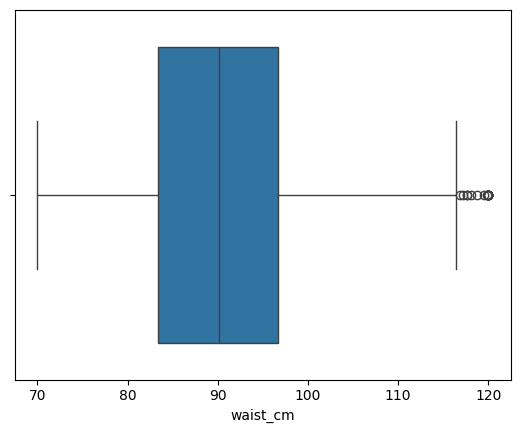

In [172]:
sns.boxplot(x=df['waist_cm'])

In [173]:
df['waist_cm'].skew()

np.float64(0.09777508155102027)

In [174]:
# remove outliers using IQR Rule 
df['waist_cm'].describe()

count    5000.000000
mean       90.137340
std         9.738638
min        70.000000
25%        83.400000
50%        90.100000
75%        96.700000
max       120.000000
Name: waist_cm, dtype: float64

In [175]:
Q1 = 83.4
Q2 = 90.1   
Q3 = 96.7
IQR=Q3-Q1

In [176]:
max=Q3+1.5*IQR
min=Q1-1.5*IQR

In [177]:
df[df['waist_cm']>max]

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
179,27.0,female,160.6,77.3,117.2,31.4,105.3,5.7,3,2423,light,muscle_gain,25.97
209,20.0,male,171.9,79.8,120.0,32.1,92.3,7.3,0,1878,sedentary,fat_loss,20.81
478,26.0,female,161.0,68.4,120.0,29.1,102.2,6.2,3,1869,moderate,fat_loss,21.45
1615,27.0,male,160.5,54.0,120.0,37.7,87.4,6.7,2,1200,sedentary,fat_loss,15.17
1957,23.0,male,178.9,90.2,120.0,35.2,94.9,7.5,3,2327,moderate,fat_loss,22.91
2035,20.0,female,156.8,40.0,117.6,29.1,94.0,8.7,3,1918,moderate,maintain,7.92
2305,19.0,male,164.9,77.9,120.0,31.6,96.8,7.7,1,1652,light,fat_loss,22.55
2506,32.0,female,151.6,41.3,119.5,28.7,89.9,4.8,7,2048,active,muscle_gain,12.72
2521,24.0,male,167.2,61.3,119.9,30.8,92.4,6.2,5,2324,light,muscle_gain,15.63
2801,21.0,male,176.0,66.6,116.9,34.0,96.6,5.7,3,2736,moderate,muscle_gain,14.43


In [178]:
df[df['waist_cm']<min]

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage


In [179]:
new_df=new_df.copy()
new_df['waist_cm']=np.where(
    new_df['waist_cm']>max,
    max,
    np.where(
        new_df['waist_cm']<min,
        min,
        new_df['waist_cm']
    )
)


In [180]:
new_df.shape

(4998, 13)

<Axes: xlabel='waist_cm'>

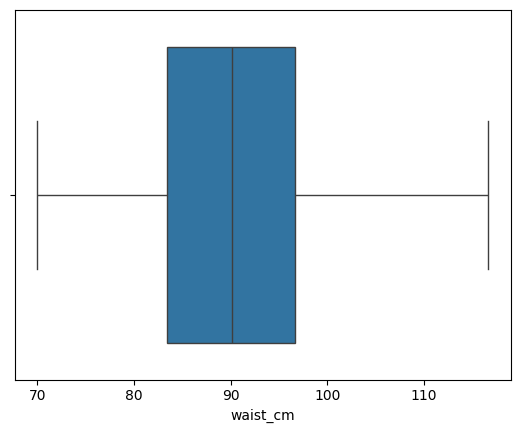

In [181]:
sns.boxplot(x=new_df['waist_cm'])

In [182]:
new_df['waist_cm'].shape

(4998,)

In [183]:
new_df.shape

(4998, 13)

In [184]:
new_df.sample(5)

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
2822,23.0,male,176.1,71.1,89.5,32.7,100.9,6.1,1,2152,light,fat_loss,16.60
1286,19.0,male,160.2,59.5,71.6,33.5,97.6,8.0,1,2198,light,maintain,15.99
650,27.0,male,170.0,79.2,108.5,32.7,103.6,7.0,6,2791,active,muscle_gain,22.90
195,29.0,male,175.0,62.6,93.9,34.0,95.9,7.4,5,2676,active,maintain,15.00
3299,16.0,male,161.0,71.7,101.4,33.1,97.5,7.6,1,2518,light,muscle_gain,20.67


<Axes: xlabel='hip_cm'>

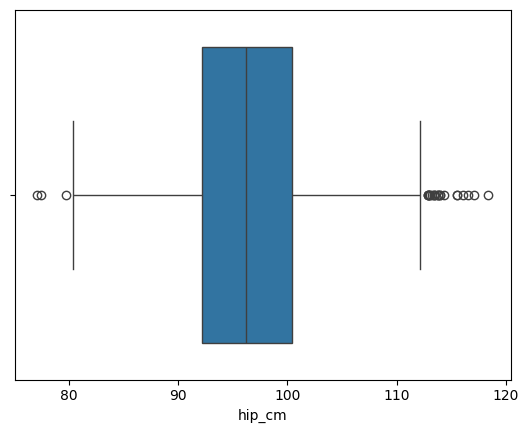

In [185]:
sns.boxplot(x=new_df['hip_cm'])


In [186]:
df['hip_cm'].skew()

np.float64(0.16111499006157878)

In [187]:
df['hip_cm'].describe()

count    5000.000000
mean       96.395680
std         5.902729
min        77.100000
25%        92.200000
50%        96.200000
75%       100.400000
max       118.400000
Name: hip_cm, dtype: float64

In [188]:
mean=96.395680
std=5.902729
lower_limit=mean-3*std
upper_limit=mean+3*std

In [189]:
df[(df['hip_cm'] > upper_limit) | (df['hip_cm'] < lower_limit)]

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
217,21.0,male,165.6,55.3,87.6,34.9,77.1,8.4,1,1871,sedentary,fat_loss,12.83
439,16.0,female,159.7,79.3,89.4,31.0,116.1,7.6,3,1614,sedentary,fat_loss,24.79
2226,18.0,female,174.6,93.0,104.2,30.7,117.1,5.6,1,1954,sedentary,fat_loss,24.55
2401,23.0,female,166.3,84.2,91.8,35.6,115.5,5.3,2,2452,light,muscle_gain,25.62
2916,23.0,male,168.7,60.2,88.2,33.4,77.4,6.5,7,2856,active,muscle_gain,14.47
2933,20.0,female,159.7,85.4,99.6,30.5,115.5,7.9,1,2426,sedentary,muscle_gain,28.58
3742,18.0,female,163.4,88.4,93.2,30.1,114.3,6.9,0,2574,sedentary,muscle_gain,27.67
3824,23.0,female,159.2,92.5,83.3,29.7,116.5,7.0,3,2293,active,fat_loss,32.89
4684,25.0,female,161.4,85.7,79.6,31.8,118.4,7.0,2,1543,sedentary,fat_loss,29.03


In [190]:
new_df = df[(df['hip_cm'] <= upper_limit) & (df['hip_cm'] >= lower_limit)]

In [191]:
new_df.shape

(4991, 13)

In [192]:
import matplotlib.pyplot as plt 

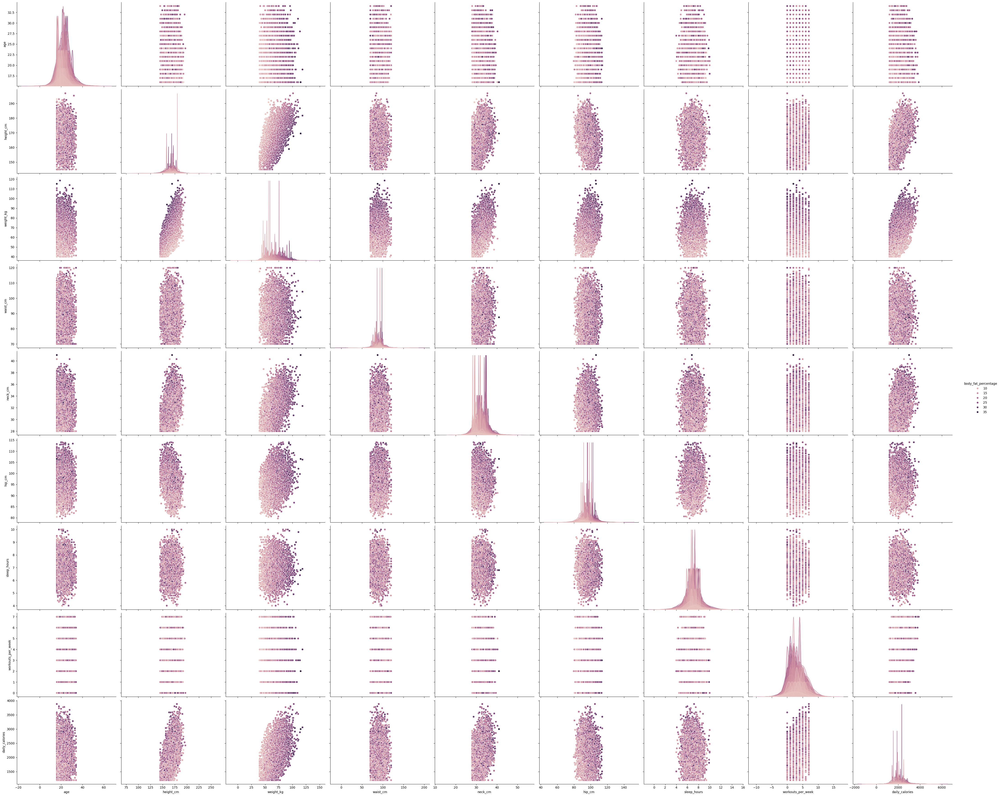

In [193]:
g = sns.pairplot(
    new_df,
    hue='body_fat_percentage',
    height=4,
    aspect=1.2
)

plt.show()

In [194]:
from ydata_profiling import ProfileReport

profile = ProfileReport(new_df, explorative=True)

profile.to_notebook_iframe()
profile.to_file("fitness_report.html")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<?, ?it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: xlabel='hip_cm'>

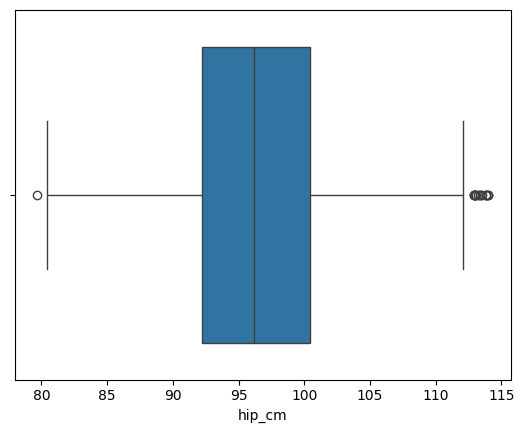

In [195]:
sns.boxplot(x=new_df['hip_cm'])

In [196]:
print(new_df.shape)
print(df.shape)

print(new_df[new_df['hip_cm'] > upper_limit])
print(new_df[new_df['hip_cm'] < lower_limit])

(4991, 13)
(5000, 13)
Empty DataFrame
Columns: [age, gender, height_cm, weight_kg, waist_cm, neck_cm, hip_cm, sleep_hours, workouts_per_week, daily_calories, activity_level, fitness_goal, body_fat_percentage]
Index: []
Empty DataFrame
Columns: [age, gender, height_cm, weight_kg, waist_cm, neck_cm, hip_cm, sleep_hours, workouts_per_week, daily_calories, activity_level, fitness_goal, body_fat_percentage]
Index: []


In [197]:
new_df.columns

Index(['age', 'gender', 'height_cm', 'weight_kg', 'waist_cm', 'neck_cm',
       'hip_cm', 'sleep_hours', 'workouts_per_week', 'daily_calories',
       'activity_level', 'fitness_goal', 'body_fat_percentage'],
      dtype='object')

In [198]:
new_df.sample(5)

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
2893,26.0,female,163.5,65.7,92.2,33.0,102.2,8.7,0,1404,sedentary,fat_loss,19.27
4657,19.0,male,171.7,74.9,80.6,33.5,93.9,6.8,2,1758,sedentary,fat_loss,18.66
2303,19.0,male,170.8,62.4,92.5,32.9,87.4,7.6,3,1548,light,fat_loss,13.84
2522,27.0,male,169.6,72.9,93.7,35.5,94.3,6.4,4,2517,light,maintain,20.42
4927,30.0,male,167.0,66.4,92.4,33.5,86.5,6.1,0,1794,sedentary,maintain,19.27


<Axes: xlabel='sleep_hours'>

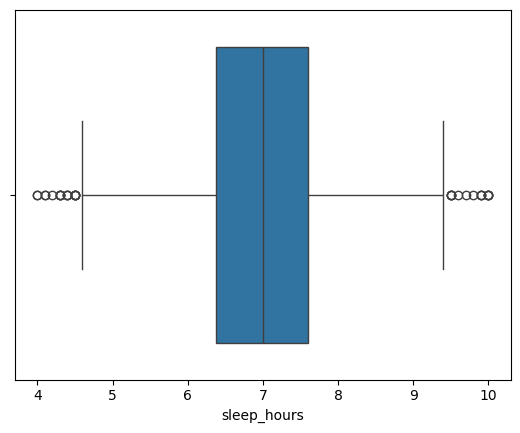

In [199]:
sns.boxplot(x=df['sleep_hours'])

In [200]:
new_df.shape

(4991, 13)

In [201]:
df['sleep_hours'].skew()

np.float64(0.08796596186608843)

In [202]:
mean=df['sleep_hours'].mean()
std=df['sleep_hours'].std()
upper_limit=mean+3*std
lower_limit=mean-3*std


In [203]:
df[(df['sleep_hours']>upper_limit) | (df['sleep_hours']<lower_limit)]

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
70,21.0,male,170.7,83.4,93.6,33.3,90.8,9.9,2,2762,light,muscle_gain,22.98
81,23.0,male,180.9,74.1,93.6,29.1,88.7,4.1,4,2320,moderate,fat_loss,16.26
1289,20.0,male,158.9,55.8,70.0,31.8,88.9,10.0,4,2476,active,fat_loss,14.92
1567,22.0,male,178.2,90.5,95.2,35.2,97.1,4.1,2,3061,light,muscle_gain,23.06
2159,18.0,male,169.1,91.7,95.6,34.6,107.8,10.0,0,2176,sedentary,maintain,26.42
2293,22.0,male,173.6,82.9,81.9,34.1,96.3,10.0,0,2206,sedentary,muscle_gain,21.87
2359,21.0,male,179.1,62.7,94.1,34.3,91.3,4.0,3,2185,moderate,maintain,12.09
2361,24.0,male,171.8,56.2,76.5,33.2,85.5,4.2,5,2607,moderate,muscle_gain,12.17
2866,22.0,male,169.5,94.6,81.6,34.4,102.0,9.9,1,1810,sedentary,fat_loss,28.37
3530,21.0,male,188.6,88.3,105.0,32.8,98.9,10.0,3,2967,moderate,muscle_gain,18.42


In [204]:
new_df=new_df.copy()
new_df['sleep_hours']=np.where(
    new_df['sleep_hours']>upper_limit,
    upper_limit,
    np.where(
        new_df['sleep_hours']<lower_limit,
        lower_limit,
        new_df['sleep_hours']
    )
)


In [205]:
new_df.shape

(4991, 13)

<Axes: xlabel='sleep_hours'>

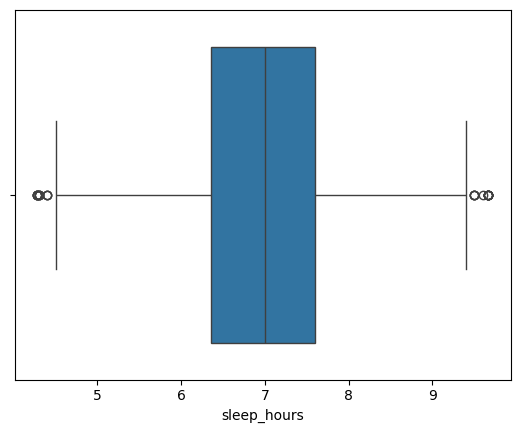

In [206]:
sns.boxplot(x=new_df['sleep_hours'])

<Axes: xlabel='workouts_per_week'>

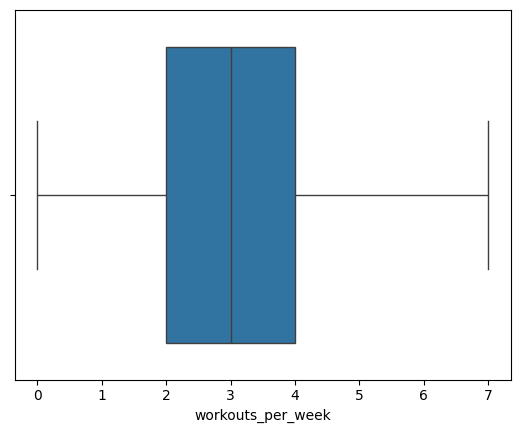

In [207]:
sns.boxplot(x=new_df['workouts_per_week'])

<Axes: xlabel='daily_calories'>

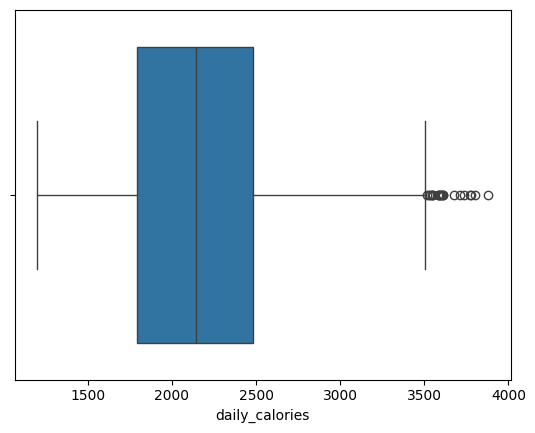

In [208]:
sns.boxplot(x=new_df['daily_calories'])

In [209]:
df['daily_calories'].skew()

np.float64(0.24201240147010122)

In [210]:
Q1 = df['daily_calories'].quantile(0.25)
Q3 = df['daily_calories'].quantile(0.75)
IQR = Q3 - Q1

lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR



In [211]:
new_df=new_df.copy()
new_df['daily_calories']=np.where(
    new_df['daily_calories']>upper_limit,
    upper_limit,
    np.where(
        new_df['daily_calories']<lower_limit,
        lower_limit,
        new_df['daily_calories']
    )
)


In [212]:
new_df.shape

(4991, 13)

<Axes: xlabel='daily_calories'>

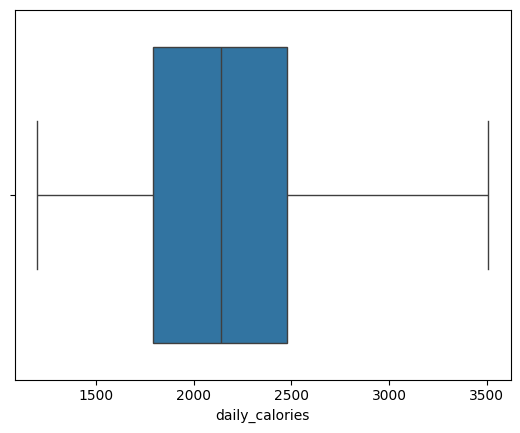

In [213]:
sns.boxplot(x=new_df['daily_calories'])

In [214]:
new_df.sample(5)

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
963,26.0,male,178.6,84.3,97.1,33.3,92.2,7.3,3,2785.0,light,muscle_gain,21.49
2556,30.0,male,172.0,62.4,70.0,34.0,89.1,7.4,2,2044.0,light,fat_loss,16.01
1780,20.0,male,170.9,56.9,75.9,32.9,89.5,7.0,4,1712.0,light,fat_loss,11.78
642,19.0,male,170.1,66.0,87.4,33.7,95.8,6.9,1,2980.0,moderate,muscle_gain,15.54
1491,21.0,female,157.5,53.2,115.6,28.7,99.1,7.3,1,1673.0,moderate,fat_loss,14.37


<Axes: xlabel='body_fat_percentage'>

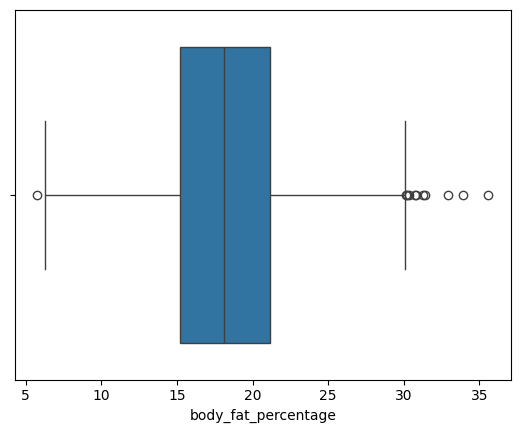

In [215]:
sns.boxplot(x=new_df['body_fat_percentage'])

In [216]:
new_df.sample(5)

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal,body_fat_percentage
4077,30.0,male,156.8,58.8,70.0,33.2,91.5,5.9,4,1854.0,moderate,fat_loss,19.40
3306,17.0,male,175.6,56.7,95.3,30.6,83.6,9.3,1,2553.0,moderate,maintain,9.78
2267,16.0,male,184.7,82.0,93.2,33.2,87.4,6.2,4,2191.0,moderate,fat_loss,16.32
1594,20.0,female,160.2,62.2,70.0,30.4,95.1,5.7,4,1851.0,active,fat_loss,17.48
2055,16.0,male,171.2,76.2,81.8,34.9,98.3,7.4,1,2564.0,light,muscle_gain,18.68


In [217]:
df['gender'].value_counts()

gender
male      3049
female    1951
Name: count, dtype: int64

In [218]:
new_df["fitness_goal"] = (
    new_df["fitness_goal"]
    .str.lower()
    .str.strip()
    .str.replace(" ", "_")
)

new_df["activity_level"] = (
    new_df["activity_level"]
    .str.lower()
    .str.strip()
)

new_df["gender"] = (
    new_df["gender"]
    .str.lower()
    .str.strip()
)


In [219]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(new_df.drop(columns=['body_fat_percentage']),new_df['body_fat_percentage'],test_size=0.2)

In [220]:
X_train.shape

(3992, 12)

In [221]:
X_train

,age,gender,height_cm,weight_kg,waist_cm,neck_cm,hip_cm,sleep_hours,workouts_per_week,daily_calories,activity_level,fitness_goal
1288,24.0,male,172.1,62.6,79.0,32.4,81.5,7.2,1,1744.0,light,fat_loss
2426,24.0,male,166.8,61.7,95.7,34.5,93.0,7.4,6,2763.0,active,muscle_gain
4992,16.0,female,150.9,43.1,88.9,28.3,90.4,7.3,5,1490.0,light,fat_loss
2753,20.0,male,169.8,72.3,88.5,33.4,91.1,7.0,5,1891.0,moderate,fat_loss
2003,23.0,female,162.8,66.9,86.9,29.5,100.5,7.4,1,1744.0,light,maintain
...,...,...,...,...,...,...,...,...,...,...,...,...
2876,30.0,male,167.0,60.2,80.6,34.6,89.7,6.0,7,2668.0,moderate,muscle_gain
3291,24.0,female,163.6,70.2,70.0,30.5,98.0,7.5,6,2646.0,active,muscle_gain
2849,17.0,male,173.3,82.1,84.6,32.4,99.4,5.8,5,3214.0,moderate,muscle_gain
1130,24.0,female,149.7,66.9,93.2,32.5,103.3,6.8,1,1524.0,light,fat_loss


In [222]:
# using column transformer we will do one hot encoding 
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler


In [223]:
numeric_cols = [
    "age","height_cm","weight_kg","waist_cm","neck_cm","hip_cm",
    "sleep_hours","workouts_per_week","daily_calories"]

In [224]:
# columns for one hot encoding = gender , fitness_goal
tnf1=ColumnTransformer(transformers=[
    ('ohe',OneHotEncoder(sparse_output=False,drop='first'),['gender','fitness_goal']),
    ('ore',OrdinalEncoder(categories=[['sedentary','light','moderate','active']]),['activity_level']),
    ('num',StandardScaler(),numeric_cols)
],remainder='passthrough')

In [225]:
X_train.shape

(3992, 12)

In [226]:
X_test.shape

(999, 12)

In [227]:
# train the model 
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline

In [228]:
from xgboost import XGBRegressor

In [229]:
tnf3 = XGBRegressor(
    n_estimators     = 500,
    learning_rate    = 0.05,
    max_depth        = 5,
    subsample        = 0.8,
    colsample_bytree = 0.8,
    random_state     = 42,
    n_jobs           = -1
)

In [230]:
tnf2=LinearRegression()

In [231]:
# create pipeline 
linear_pipe=Pipeline([
    ('tnf1',tnf1),
    ('tnf2',tnf2)
])

In [232]:
# train 
linear_pipe.fit(X_train,y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('tnf1', ...), ('tnf2', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('ohe', ...), ('ore', ...), ...]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers

In [233]:
xg_pipe=Pipeline([
    ('tnf1',tnf1),
    ('tnf3',tnf3)
])

In [234]:

xg_pipe.fit(X_train, y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('tnf1', ...), ('tnf3', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('ohe', ...), ('ore', ...), ...]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'passthrough'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers

In [235]:
y_pred_linear=linear_pipe.predict(X_test)

In [236]:
y_pred_xg = xg_pipe.predict(X_test)

In [237]:
from sklearn.metrics import r2_score
r2=r2_score(y_test,y_pred_linear)
print("R2_Score_linear",r2)

R2_Score_linear 0.9890126522350267


In [238]:
r2=r2_score(y_test,y_pred_xg)
print("R2_Score_xg",r2)

R2_Score_xg 0.9954674550704692


In [239]:
from sklearn.metrics import mean_absolute_error,mean_squared_error
mae_linear=mean_absolute_error(y_test,y_pred_linear)
rmse_linear=np.sqrt(mean_squared_error(y_test,y_pred_linear))

In [240]:
print("MAE",mae_linear)
print("RMSE",rmse_linear)

MAE 0.3227343591110555
RMSE 0.47237465952485225


In [241]:
mae_xg=mean_absolute_error(y_test,y_pred_xg)
rmse_xg=np.sqrt(mean_squared_error(y_test,y_pred_xg))

In [242]:
print("MAE",mae_xg)
print("RMSE",rmse_xg)

MAE 0.21451774066394275
RMSE 0.30339695337671174


In [243]:
import pandas as pd

new_person = pd.DataFrame([{
    "age": 25,
    "gender": "male",
    "height_cm": 178,
    "weight_kg": 75,
    "waist_cm": 82,
    "neck_cm": 38,
    "hip_cm": 95,
    "sleep_hours": 7,
    "workouts_per_week": 4,
    "daily_calories": 2500,
    "activity_level": "moderate",
    "fitness_goal": "fat_loss"
}])

prediction = xg_pipe.predict(new_person)

print("Predicted Body Fat %:", prediction[0])

Predicted Body Fat %: 17.91562


In [244]:
import joblib

joblib.dump(xg_pipe, "gym_ai_bodyfat_model.pkl")

['gym_ai_bodyfat_model.pkl']

In [245]:
def bf_category(bf,gender=None):
    # return a healthy- focused catogory for body fat percentage 
    if bf is None:
        return "Body fat percentage is mandatory "
    g=str(gender).lower().strip() if gender is not None else None

    if g not in ["male","female"]:
        if bf < 10:
            return "LOW BODY FAT PERCENTAGE"
        if bf < 20:
            return "HEALTHY BODY FAT PERCENTAGE "
        if bf <30:
            return "HIGH BODY FAT PERCENTAGE"
        return "VERY HIGH BODY  FAT PERCENTAGE "

    if g=="male":
        if bf<10:
            return "LOW BODY FAT PERCENTAGE"
        if bf<20:
            return "HEALTHY BODY FAT PERCENTAGE "
        if bf<28:
            return "HIGH BODY FAT PERCENTAGE"
        return "VERY HIGH BODY FAT PERCENTAGE"

    if g=="female":
        if bf<14:
            return "LOW BODY FAT PERCENTAGE"
        if bf<23:
            return "HEALTHY BODY FAT PERCENTAGE"
        if bf<31:
            return "HIGH BODY FAT PERCENTAGE"
        return "VERY HIGH BODY FAT PERCENTAGE"

In [246]:
def workout_split_with_bf(workouts_per_week, fitness_goal, activity_level, bf_percent, gender=None):
    fitness_goal = str(fitness_goal).lower().strip().replace(" ", "_")
    activity_level = str(activity_level).lower().strip()
    cat = bf_category(bf_percent, gender)

    # --- Base split by days ---
    if workouts_per_week <= 0:
        split = ["Start with 2 days/week: Full Body A/B (build habit)."]
    elif workouts_per_week == 1:
        split = ["Full Body: Squat / Push / Pull / Hinge / Core"]
    elif workouts_per_week == 2:
        split = ["Full Body A", "Full Body B"]
    elif workouts_per_week == 3:
        split = ["Upper", "Lower", "Full Body"]
    elif workouts_per_week == 4:
        split = ["Upper", "Lower", "Upper", "Lower"]
    elif workouts_per_week == 5:
        split = ["Push", "Pull", "Legs", "Upper", "Lower"]
    else:  # 6+
        split = ["Push", "Pull", "Legs", "Push", "Pull", "Legs"]

    # --- Goal-based defaults ---
    if fitness_goal == "fat_loss":
        notes = {
            "goal_focus": "Fat-loss focus: keep strength + add cardio/steps; rest 45–75s on accessories.",
            "sets_reps": "Main lifts 6–10 reps, accessories 10–15 reps (progress weekly).",
        }
    elif fitness_goal == "muscle_gain":
        notes = {
            "goal_focus": "Muscle-gain focus: progressive overload; rest 90–150s on big lifts.",
            "sets_reps": "Main lifts 6–12 reps, accessories 10–20 reps; add volume gradually.",
        }
    else:  # maintenance/other
        notes = {
            "goal_focus": "Maintenance focus: balanced strength + conditioning; rest 60–120s.",
            "sets_reps": "Mostly 8–12 reps; steady progression + 2–3 cardio sessions/week.",
        }

    # --- BF% category adjustments (health-focused, practical) ---
    # We adjust cardio + strength emphasis gently based on category
    bf_plan = {}
    if cat == " VERY HIGH BODY FAT PERCENTAGE":
        bf_plan["bf_focus"] = "Very High BF%: prioritize consistency + steps/cardio while keeping strength training."
        bf_plan["cardio"] = "Cardio: 20–35 min, 4–5x/week (or 8–12k steps/day)."
        bf_plan["strength"] = "Strength: full-body/upper-lower works best; avoid extreme volume at start."
    elif cat == "HIGH BODY FAT PERCENTAGE":
        bf_plan["bf_focus"] = "Slightly higher BF%: balanced strength + moderate cardio."
        bf_plan["cardio"] = "Cardio: 15–25 min, 3–4x/week (or 7–10k steps/day)."
        bf_plan["strength"] = "Strength: keep progression on big lifts; accessories moderate."
    elif cat == "HEALTHY BODY FAT PERCENTAGE":
        bf_plan["bf_focus"] = "Healthy range: choose goal-driven plan (fat loss / gain / maintain)."
        bf_plan["cardio"] = "Cardio: 2–3x/week for fitness (more if fat_loss)."
        bf_plan["strength"] = "Strength: progress steadily; good time to build muscle/strength."
    else:  # "lower"
        bf_plan["bf_focus"] = "Low BF%: focus on performance, recovery, and adequate nutrition."
        bf_plan["cardio"] = "Cardio: keep light/moderate 1–3x/week for heart fitness."
        bf_plan["strength"] = "Strength: prioritize progressive overload + recovery (sleep/food)."

    # --- Activity-level safety adjustment ---
    safety = {}
    if activity_level in ["sedentary", "light"] and workouts_per_week >= 5:
        safety["safety"] = "Low activity level selected: start 3–4 days/week for 2–3 weeks, then increase."
    else:
        safety["safety"] = "Warm-up 5–10 min + 1–2 lighter sets before heavy lifts."

    # --- Extra smart tweak: if goal is fat_loss AND BF is high/higher, push full-body bias ---
    if fitness_goal == "fat_loss" and cat in ["VERY HIGH BODY FAT PERCENTAGE", "HIGH BODY FAT PERCENTAGE"] and workouts_per_week >= 4:
        split_hint = "Optional: swap to 3–4 days Full Body (A/B/C) for better calorie burn + recovery."
    else:
        split_hint = "Stick to the split; increase weights/reps gradually each week."

    notes.update(bf_plan)
    notes.update(safety)
    notes["split_hint"] = split_hint
    notes["bf_category"] = cat
    return split, notes

In [ ]:
HOME_EXERCISES = {
    "Full Body A": {
        "no_equipment": [
            ("Squats", "3x12"),
            ("Push-ups (knees if needed)", "3x8-12"),
            ("Glute Bridge", "3x15"),
            ("Plank", "3x30-45s"),
            ("Mountain Climbers", "3x30s")
        ],
        "minimal": [
            ("Goblet Squat (backpack)", "3x10-12"),
            ("Push-ups", "3x8-12"),
            ("Backpack Row", "3x10-12"),
            ("Glute Bridge", "3x15"),
            ("Plank", "3x30-60s")
        ]
    },
    "Full Body B": {
        "no_equipment": [
            ("Reverse Lunges", "3x10/leg"),
            ("Pike Push-ups", "3x6-10"),
            ("Hip Hinge (good-morning)", "3x12"),
            ("Dead Bug", "3x10/side"),
            ("Jumping Jacks", "3x45s")
        ],
        "minimal": [
            ("Split Squat (backpack)", "3x10/leg"),
            ("Overhead Press (water bottles)", "3x10-12"),
            ("Backpack Romanian Deadlift", "3x10-12"),
            ("Side Plank", "3x25-40s/side"),
            ("High Knees", "3x30-45s")
        ]
    },
    "Upper": {
        "no_equipment": [
            ("Push-ups", "4x8-12"),
            ("Chair Dips", "3x8-12"),
            ("Inverted Row (table) / Towel Row (door)", "3x6-10"),
            ("Pike Push-ups", "3x6-10"),
            ("Plank Shoulder Taps", "3x20 taps")
        ],
        "minimal": [
            ("Push-ups", "4x8-12"),
            ("Backpack Row", "4x10-12"),
            ("Overhead Press (water bottles)", "3x10-12"),
            ("Bicep Curl (bags)", "3x12-15"),
            ("Tricep Extensions (bag)", "3x12-15")
        ]
    },
    "Lower": {
        "no_equipment": [
            ("Squats", "4x12-15"),
            ("Reverse Lunges", "3x10/leg"),
            ("Glute Bridge", "4x15"),
            ("Wall Sit", "3x30-60s"),
            ("Calf Raises", "3x20")
        ],
        "minimal": [
            ("Backpack Squat", "4x10-12"),
            ("Bulgarian Split Squat (chair)", "3x8-10/leg"),
            ("Backpack RDL", "4x10-12"),
            ("Glute Bridge", "3x15"),
            ("Calf Raises", "3x20")
        ]
    },
    "Push": {
        "no_equipment": [
            ("Push-ups", "4x8-12"),
            ("Pike Push-ups", "3x6-10"),
            ("Chair Dips", "3x8-12"),
            ("Diamond Push-ups (or knees)", "3x6-10"),
            ("Plank", "3x30-60s")
        ],
        "minimal": [
            ("Push-ups", "4x8-12"),
            ("Overhead Press (water bottles)", "4x10-12"),
            ("Floor Press (backpack)", "3x10-12"),
            ("Tricep Extensions (bag)", "3x12-15"),
            ("Plank", "3x30-60s")
        ]
    },
    "Pull": {
        "no_equipment": [
            ("Towel Row (door) / Inverted Row (table)", "4x6-10"),
            ("Superman Holds", "3x30-45s"),
            ("Reverse Snow Angels", "3x12"),
            ("Bicep Isometrics (towel)", "3x20s"),
            ("Dead Bug", "3x10/side")
        ],
        "minimal": [
            ("Backpack Row", "4x10-12"),
            ("Backpack Shrugs", "3x12-15"),
            ("Bicep Curl (bags)", "4x12-15"),
            ("Face Pull (towel band)", "3x12-15"),
            ("Back Extension (superman)", "3x12")
        ]
    },
    "Legs": {
        "no_equipment": [
            ("Squats", "4x12-15"),
            ("Jump Squats (optional)", "3x10"),
            ("Walking Lunges", "3x10/leg"),
            ("Glute Bridge", "4x15"),
            ("Calf Raises", "4x20")
        ],
        "minimal": [
            ("Backpack Squat", "4x10-12"),
            ("Bulgarian Split Squat", "4x8-10/leg"),
            ("Backpack RDL", "4x10-12"),
            ("Glute Bridge", "3x15"),
            ("Calf Raises", "4x20")
        ]
    }
}

In [248]:
def choose_split(workouts_per_week):
    if workouts_per_week <= 1:
        return ["Full Body A"]
    if workouts_per_week == 2:
        return ["Full Body A", "Full Body B"]
    if workouts_per_week == 3:
        return ["Upper", "Lower", "Full Body A"]
    if workouts_per_week == 4:
        return ["Upper", "Lower", "Upper", "Lower"]
    if workouts_per_week == 5:
        return ["Push", "Pull", "Legs", "Upper", "Lower"]
    return ["Push", "Pull", "Legs", "Push", "Pull", "Legs"]

In [249]:
def home_workout_plan(workouts_per_week, equipment="no_equipment"):
    split = choose_split(workouts_per_week)

    plan = {}
    for i, day in enumerate(split, start=1):
        if day in HOME_EXERCISES:
            plan[f"Day {i} - {day}"] = HOME_EXERCISES[day][equipment]
        else:
            plan[f"Day {i} - {day}"] = [("Brisk Walk / Steps", "20-30 min")]

    return split, plan

In [250]:
import pandas as pd

# Example person (same columns as your X)
new_person = pd.DataFrame([{
    "age": 24,
    "gender": "male",
    "height_cm": 178,
    "weight_kg": 55,
    "waist_cm": 66,
    "neck_cm": 23,
    "hip_cm": 77,
    "sleep_hours": 7,
    "workouts_per_week": 7,
    "daily_calories": 2500,
    "activity_level": "moderate",
    "fitness_goal": "fat loss"   # even if space, you can clean it before predict
}])

# Clean user input text (important)
new_person["fitness_goal"] = new_person["fitness_goal"].str.lower().str.strip().str.replace(" ", "_")
new_person["activity_level"] = new_person["activity_level"].str.lower().str.strip()
new_person["gender"] = new_person["gender"].str.lower().str.strip()

pred_bf = xg_pipe.predict(new_person)[0]

split, notes = workout_split_with_bf(
    workouts_per_week=int(new_person.loc[0, "workouts_per_week"]),
    fitness_goal=new_person.loc[0, "fitness_goal"],
    activity_level=new_person.loc[0, "activity_level"],
    bf_percent=float(pred_bf),
    gender=new_person.loc[0, "gender"]
)

print("Predicted BF%:", round(pred_bf, 2))
print("Workout Split:", split)
print("Notes:")
for k, v in notes.items():
    print(f"- {k}: {v}")

Predicted BF%: 10.3
Workout Split: ['Push', 'Pull', 'Legs', 'Push', 'Pull', 'Legs']
Notes:
- goal_focus: Fat-loss focus: keep strength + add cardio/steps; rest 45–75s on accessories.
- sets_reps: Main lifts 6–10 reps, accessories 10–15 reps (progress weekly).
- bf_focus: Low BF%: focus on performance, recovery, and adequate nutrition.
- cardio: Cardio: keep light/moderate 1–3x/week for heart fitness.
- strength: Strength: prioritize progressive overload + recovery (sleep/food).
- safety: Warm-up 5–10 min + 1–2 lighter sets before heavy lifts.
- split_hint: Stick to the split; increase weights/reps gradually each week.
- bf_category: HEALTHY BODY FAT PERCENTAGE 
